# Data Quality Assessment

In [53]:
import DataProfileViewer
import datamart_profiler
import pandas as pd
import random
from pyod.models.knn import KNN
from pyod.utils.data import generate_data
from pyod.utils.data import evaluate_print
from pyod.utils.example import visualize
from sklearn.preprocessing import StandardScaler

## Step 1: dataset visulization

In [54]:
data_path = 'dataset/SARS-CoV-2_concentrations_measured_in_NYC_Wastewater_20240403.csv'
metadata = datamart_profiler.process_dataset(data_path, include_sample=True, plots=True)
DataProfileViewer.plot_data_summary(metadata)

/Users/iris/opt/anaconda3/envs/py39/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/iris/opt/anaconda3/envs/py39/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/iris/opt/anaconda3/envs/py39/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/iris/opt/anaconda3/envs/py39/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

In [55]:
# Read the CSV file into a DataFrame
df = pd.read_csv(data_path)
row_num = df.count()[0]
print('Number of rows:',row_num)
print('Column Names:',df.columns)

Number of rows: 4648
Column Names: Index(['Sample Date', 'Test date', 'WRRF Name', 'WRRF Abbreviation',
       'Concentration SARS-CoV-2 gene target (N1 Copies/L) ',
       'Per capita SARS-CoV-2 load (N1 copies per day per population)',
       'Annotation', 'Population Served, estimated ', 'Technology'],
      dtype='object')


## Step 2: Find Null

In [56]:
# Drop rows with any null values
y_col = "Concentration SARS-CoV-2 gene target (N1 Copies/L) "
x_col = "Per capita SARS-CoV-2 load (N1 copies per day per population)"
df_cleaned = df[[x_col,y_col]].dropna()
row_cleaned_num = df_cleaned.count()[0]
print('Number of cleaned rows:',row_cleaned_num)

Number of cleaned rows: 4454


## Step 3: Find Outliers(invalid values)

### 3.1 Get data

In [57]:
contamination = 0.1  # percentage of outliers
offset = 3  # ratio of outliers in the inliers
n_train = int(row_cleaned_num * 0.7)  # number of training points
n_test = row_cleaned_num - n_train # number of testing points
n_train_inliers = int((1 - contamination) * n_train)
n_train_outliers = n_train - n_train_inliers
n_test_inliers = int((1 - contamination) * n_test)
n_test_outliers = n_test - n_test_inliers

# Shuffle the DataFrame randomly
df_shuffled = df_cleaned.sample(frac=1, random_state=42)

# Split the DataFrame into two parts
d_train = df_shuffled[:n_train]
d_test = df_shuffled[n_train:]

# Initialize the scaler
scaler = StandardScaler()
# Fit the scaler to the data
scaler.fit(d_train)
scaler.fit(d_test)
# Transform the data
d_train_t = scaler.transform(d_train)
d_test_t = scaler.transform(d_test)
# Convert back to DataFrame
d_train = pd.DataFrame(d_train_t, columns=d_train.columns)
d_test = pd.DataFrame(d_test_t, columns=d_test.columns)

d_train[y_col][-n_train_outliers:] = d_train[y_col][-n_train_outliers:] + (offset * random.choice([-1, 1]))
d_test[y_col][-n_test_outliers:] = d_test[y_col][-n_test_outliers:] + (offset * random.choice([-1, 1]))

X_train, X_test = d_train[[x_col,y_col]].values, d_test[[x_col,y_col]].values
y_train, y_test = [0] * n_train_inliers + [1] * n_train_outliers, [0] * n_test_inliers + [1] * n_test_outliers

### 3.2 KNN model

In [58]:
# train kNN detector
clf_name = 'KNN'
clf = KNN()
clf.fit(X_train)

# get the prediction labels and outlier scores of the training data
y_train_pred = clf.labels_  # binary labels (0: inliers, 1: outliers)
y_train_scores = clf.decision_scores_  # raw outlier scores

# get the prediction on the test data
y_test_pred = clf.predict(X_test)  # outlier labels (0 or 1)
y_test_scores = clf.decision_function(X_test)  # outlier scores

# it is possible to get the prediction confidence as well
y_test_pred, y_test_pred_confidence = clf.predict(X_test, return_confidence=True)  # outlier labels (0 or 1) and confidence in the range of [0,1]

### 3.3 Evaluate the prediction using ROC and Precision @ Rank n

In [59]:
# unfinshed
# evaluate and print the results
print("\nOn Training Data:")
evaluate_print(clf_name, y_train, y_train_scores)
print("\nOn Test Data:")
evaluate_print(clf_name, y_test, y_test_scores)


On Training Data:
KNN ROC:0.6749, precision @ rank n:0.2436

On Test Data:
KNN ROC:0.9986, precision @ rank n:0.9701


### 3.4 Generate the visualizations

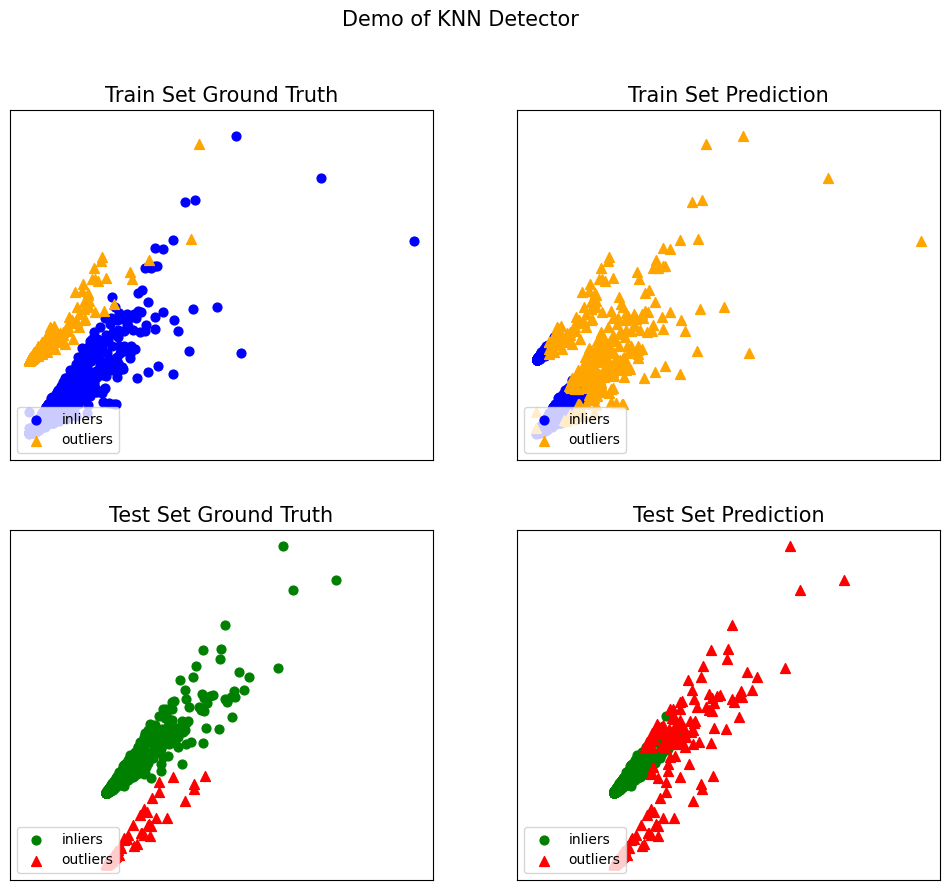

In [60]:
visualize(clf_name, X_train, y_train, X_test, y_test, y_train_pred,
          y_test_pred, show_figure=True, save_figure=False)